# Preprocessing and clustering

## Loading import

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import anndata as ad
from scipy import sparse
import os
from anndata.experimental.multi_files import AnnCollection
from matplotlib.pyplot import rc_context
# import seaborn as sns
# import matplotlib.pyplot as plt

In [2]:
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, frameon=False, figsize=(3, 3), facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.5 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.10 louvain==0.7.1 pynndescent==0.5.4


In [3]:
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', None)

## Input data

In [4]:
# !mkdir write
# !mkdir tables

In [5]:
wdir = "/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/01_clustering/"
os.chdir( wdir )

# Preprocessing

## Highest_expr_genes

In [6]:
adata = sc.read_h5ad('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_00_merge_20231027.h5ad')

normalizing counts per cell
    finished (0:00:02)


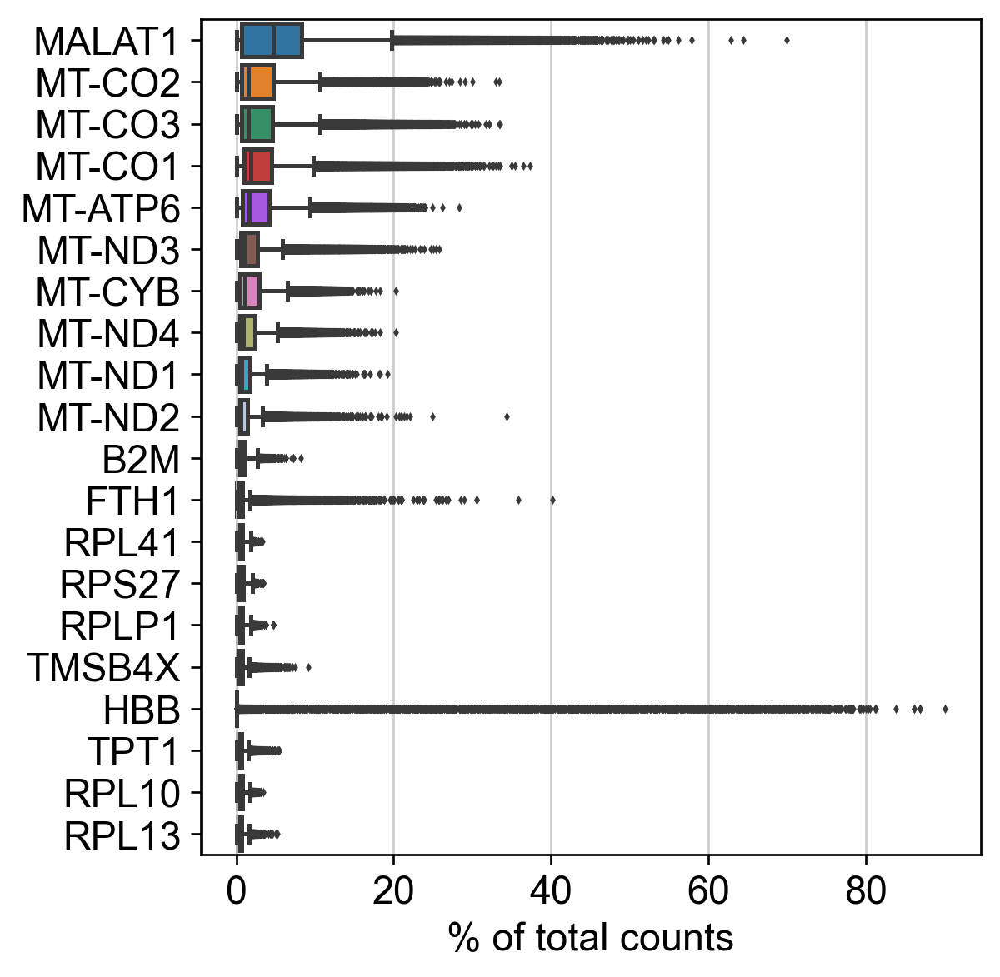

In [7]:
sc.pl.highest_expr_genes(adata, n_top=20, show=True)

# current_palette = sns.color_palette("dark")
# sns.palplot(current_palette)
# sc.pl.highest_expr_genes(adata, n_top=20, palette="dark")

# with sns.color_palette("PuBuGn_d"):
#     sc.pl.highest_expr_genes(adata, n_top=20)

# sns.set_style("white")
# sc.pl.highest_expr_genes(adata, n_top=20, )

## Basic filtering, cell QC

In [8]:
adata

AnnData object with n_obs × n_vars = 137760 × 38224
    obs: 'batch', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [9]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 10790 cells that have less than 200 genes expressed
filtered out 7498 genes that are detected in less than 3 cells


In [10]:
# 线粒体基因
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# 核糖体基因
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# 血红蛋白基因
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))

sc.pp.calculate_qc_metrics(adata, 
                           qc_vars=["mt", "ribo", "hb"], 
                           inplace=True, 
                           percent_top=[20], 
                           log1p=True)

In [11]:
# adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
# sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [12]:
adata

AnnData object with n_obs × n_vars = 126970 × 30726
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts'

In [13]:
# from scipy.sparse import issparse
# if issparse(adata.X):
#     adata.obs['nUMIs'] = adata.X.toarray().sum(axis=1)  
#     adata.obs['mito_perc'] = adata[:, adata.var["mt"]].X.toarray().sum(axis=1) / adata.obs['nUMIs'].values
#     adata.obs['detected_genes'] = (adata.X.toarray() > 0).sum(axis=1)  
# else:
#     adata.obs['nUMIs'] = adata.X.sum(axis=1)  
#     adata.obs['mito_perc'] = adata[:, adata.var["mt"]].X.sum(axis=1) / adata.obs['nUMIs'].values
#     adata.obs['detected_genes'] = (adata.X > 0).sum(axis=1)  

In [14]:
# adata.obs[['nUMIs','total_counts','n_genes_by_counts','detected_genes','pct_counts_mt','mito_perc',]]

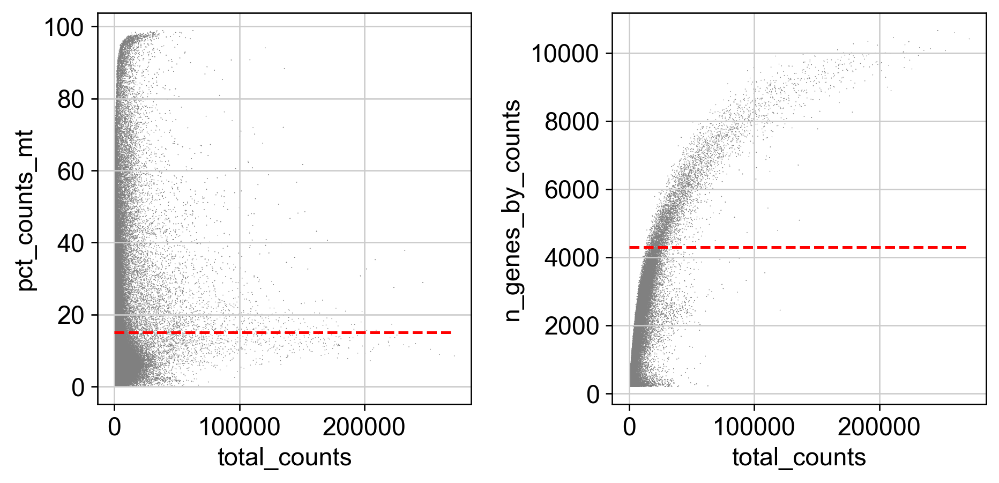

In [15]:
import matplotlib.pyplot as plt
mito_filter = 15
n_counts_filter = 4300
fig, axs = plt.subplots(ncols = 2, figsize = (8,4))
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt',ax = axs[0], show=False)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts',ax = axs[1], show = False)
#draw horizontal red lines indicating thresholds.
axs[0].hlines(y = mito_filter, xmin = 0, xmax = max(adata.obs['total_counts']), color = 'red', ls = 'dashed')
axs[1].hlines(y = n_counts_filter, xmin = 0, xmax = max(adata.obs['total_counts']), color = 'red', ls = 'dashed')
fig.tight_layout()
plt.show()

## Violin plot and FacetGrid of scatter

A violin plot of some of the computed quality measures:
* the number of genes expressed in the count matrix
* the total counts per cell
* the percentage of counts in mitochondrial genes

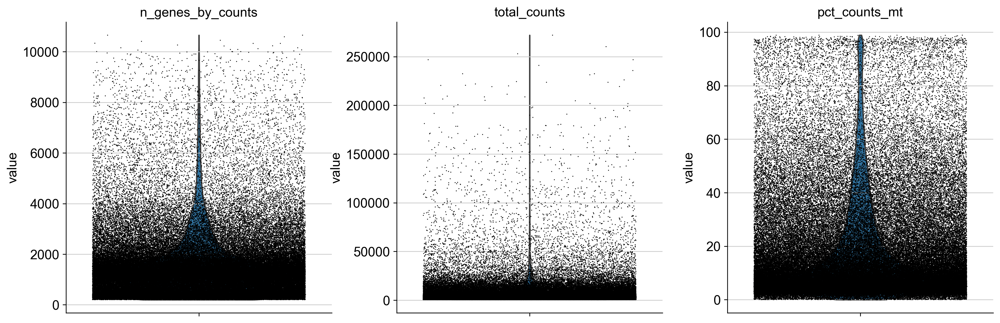

In [16]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True, show=True)

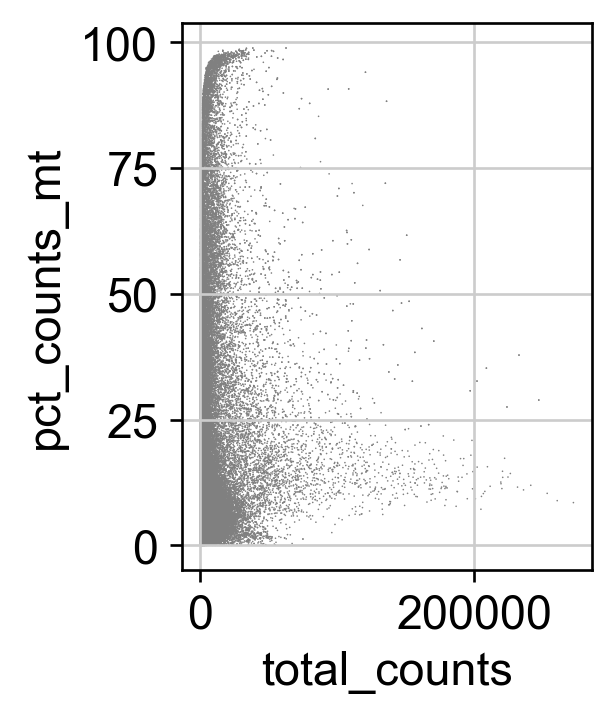

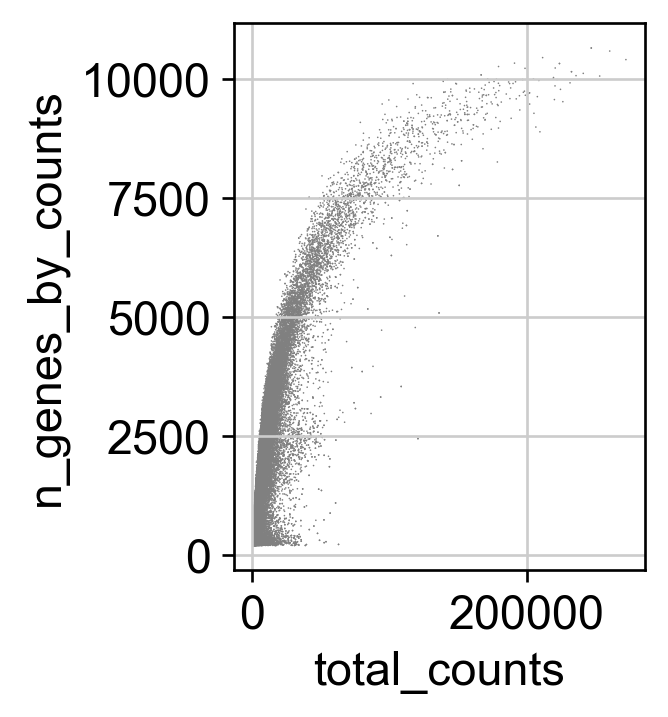

In [17]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', show=True)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', show=True)

## Actually do the filtering by slicing the AnnData object.

In [18]:
# 保留基因数 ≤ 3000，线粒体基因含量 ≤ 10% 的 gene [barcode]
adata = adata[adata.obs.n_genes_by_counts < 3000, :]
adata = adata[adata.obs.pct_counts_mt < 10, :]

In [19]:
adata

View of AnnData object with n_obs × n_vars = 56163 × 30726
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts'

Total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells.

In [20]:
sc.pp.normalize_total(adata, target_sum=1e4)
# Logarithmize the data:
sc.pp.log1p(adata)

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


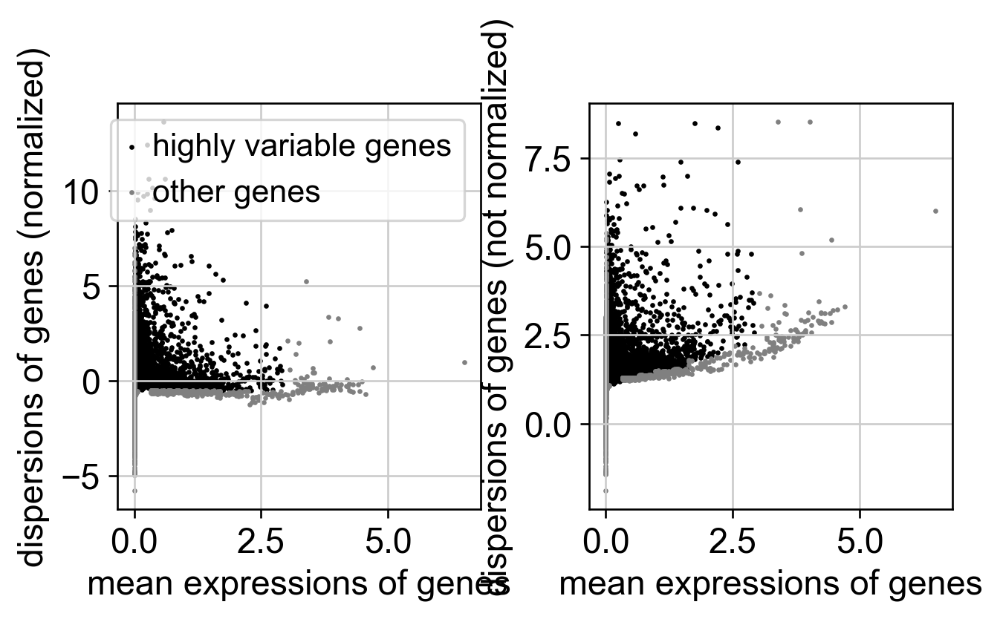

In [21]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=-0.5)
sc.pl.highly_variable_genes(adata, show=True)

In [22]:
res = adata[:, adata.var.highly_variable].var
res.to_csv('adata_var_highly_variable.csv')

In [23]:
adata

AnnData object with n_obs × n_vars = 56163 × 30726
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [24]:
adata[:, adata.var.highly_variable]

View of AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [25]:
adata.raw = adata
adata = adata[:, adata.var.highly_variable]

In [26]:
adata

View of AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [27]:
sc.pp.recipe_zheng17(adata, n_top_genes=13401)

running recipe zheng17


/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:249: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_counts'] = number


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
    finished (0:00:09)


In [28]:
adata

AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'log1p', 'hvg'

In [29]:
adata.write_h5ad('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_02_filter_20231027.h5ad')

## Principal component analysis, and compute the neighborhood graph of cells using the PCA representation

In [30]:
adata = sc.read_h5ad('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_02_filter_20231027.h5ad')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:34)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:14)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:09:40)


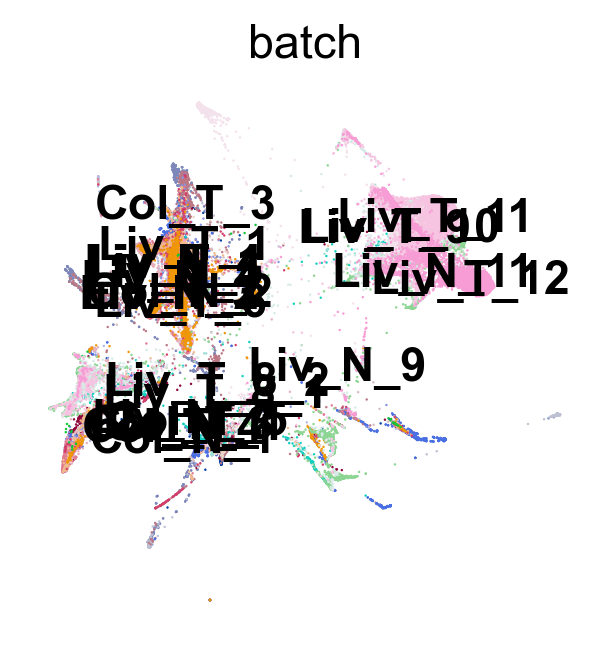

In [31]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=50)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)
sc.tl.draw_graph(adata, color='batch', legend_loc='on data', show=True)
sc.pl.draw_graph(adata, color='batch', legend_loc='on data', show=True)

In [32]:
adata

AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'draw_graph', 'batch_colors'
    obsm: 'X_pca', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [33]:
sce.pp.harmony_integrate(adata, 'batch')
# sce.pp.scanorama_integrate(adata, 'batch')

2023-10-28 10:22:37,848 - harmonypy - INFO - Iteration 1 of 10
2023-10-28 10:22:53,568 - harmonypy - INFO - Iteration 2 of 10
2023-10-28 10:23:08,851 - harmonypy - INFO - Iteration 3 of 10
2023-10-28 10:23:24,934 - harmonypy - INFO - Converged after 3 iterations


In [34]:
'X_pca_harmony' in adata.obsm

True

In [35]:
adata

AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'draw_graph', 'batch_colors'
    obsm: 'X_pca', 'X_draw_graph_fa', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

## Seeing the batch effect

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:42)


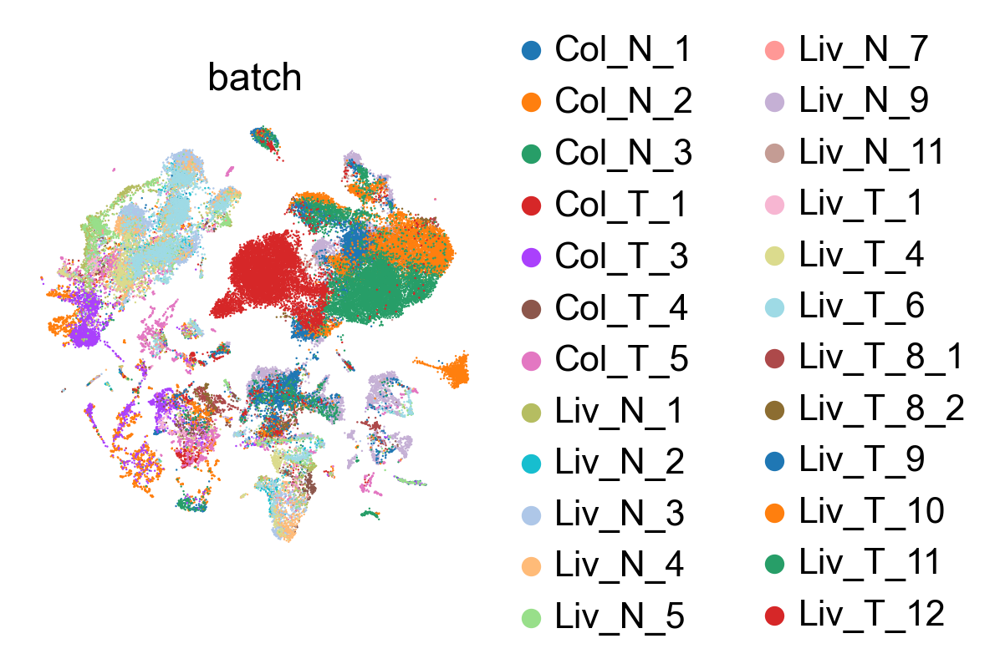

In [36]:
# sc.tl.pca(adata, svd_solver='arpack', n_comps=50)
# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch'], palette=sc.pl.palettes.vega_20_scanpy, show=True, save="_01_harmony.pdf")

## Density plot

computing density on 'umap'
--> added
    'umap_density_batch', densities (adata.obs)
    'umap_density_batch_params', parameter (adata.uns)


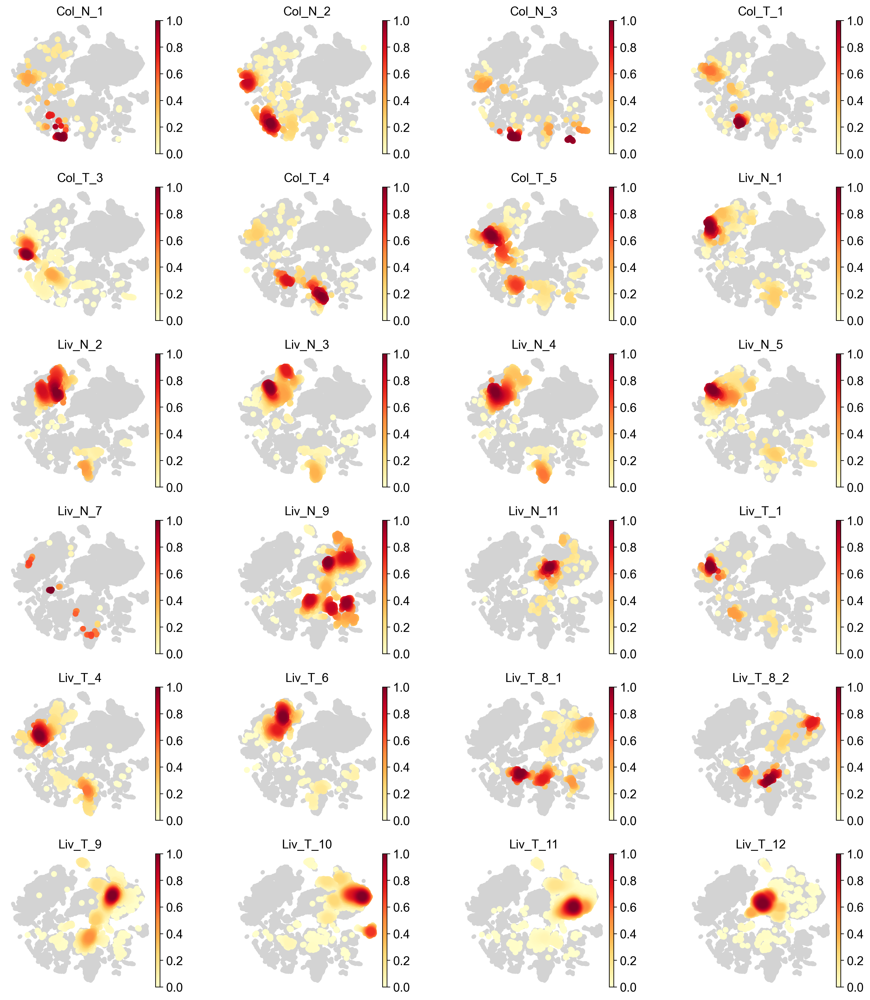

In [37]:
sc.tl.embedding_density(adata, groupby='batch')
sc.pl.embedding_density(adata, groupby='batch', wspace=0.4, show=True)

## Partial visualizaton of a subset of groups in embedding

In [38]:
adata.obs['batch'].value_counts().head(30)

Liv_T_12    7800
Liv_T_11    7736
Liv_T_10    7350
Liv_T_9     5567
Liv_N_9     4310
            ... 
Col_N_3      396
Liv_T_1      343
Col_N_1      238
Liv_N_11     222
Liv_N_7       42
Name: batch, Length: 24, dtype: int64

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


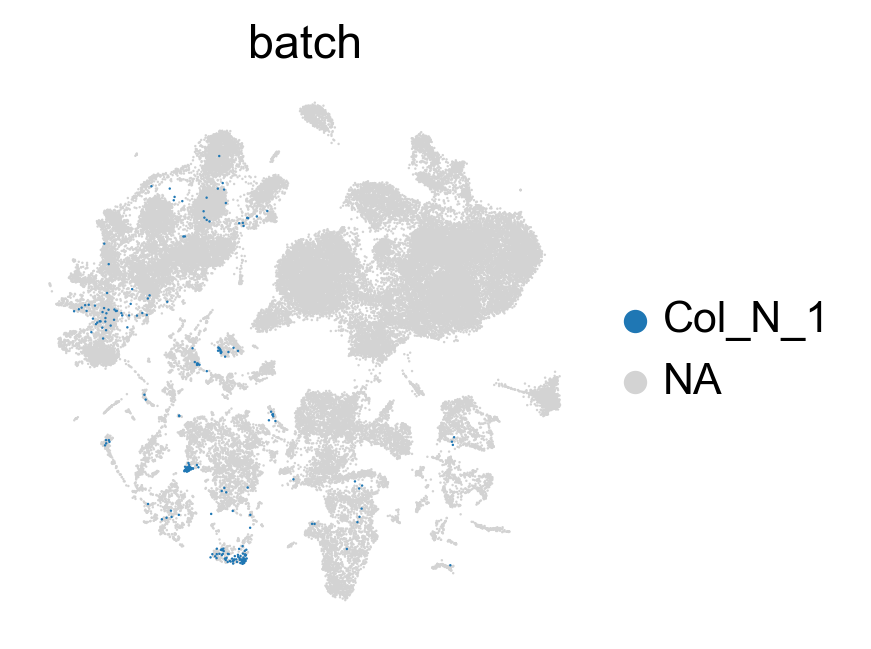

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


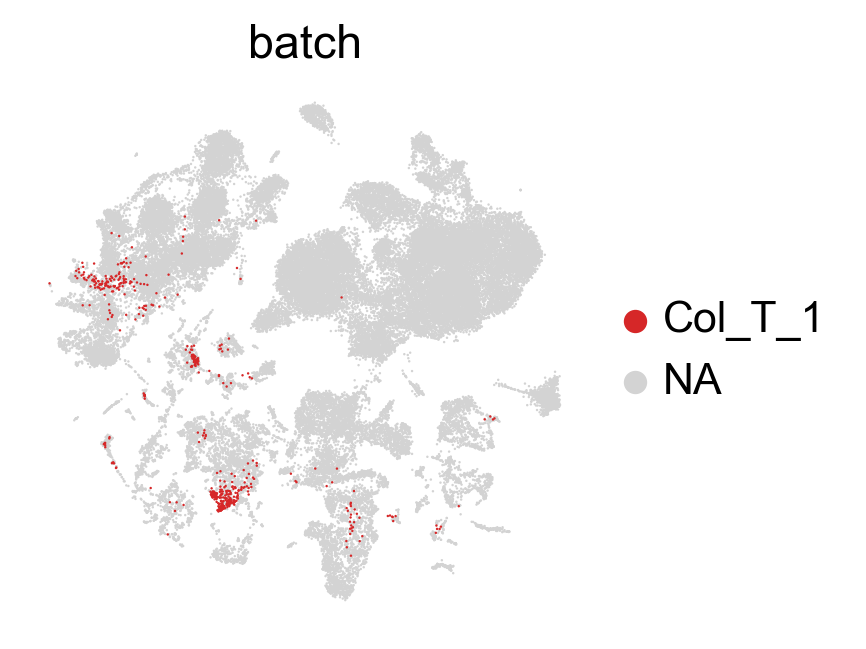

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


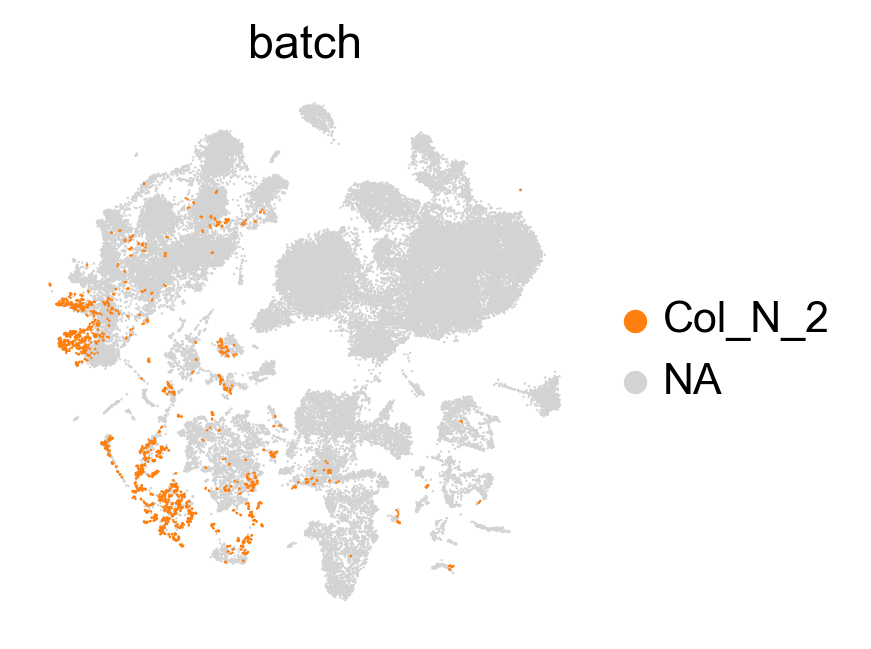

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


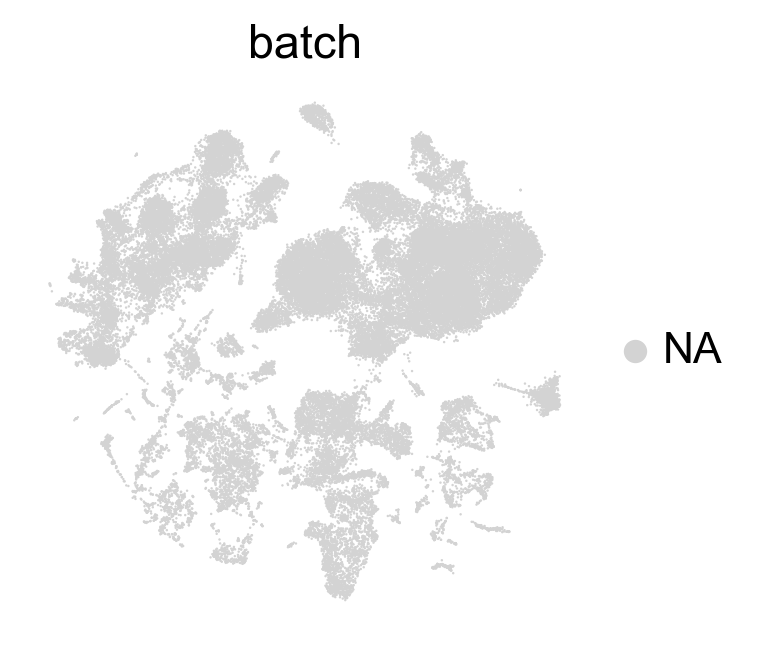

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


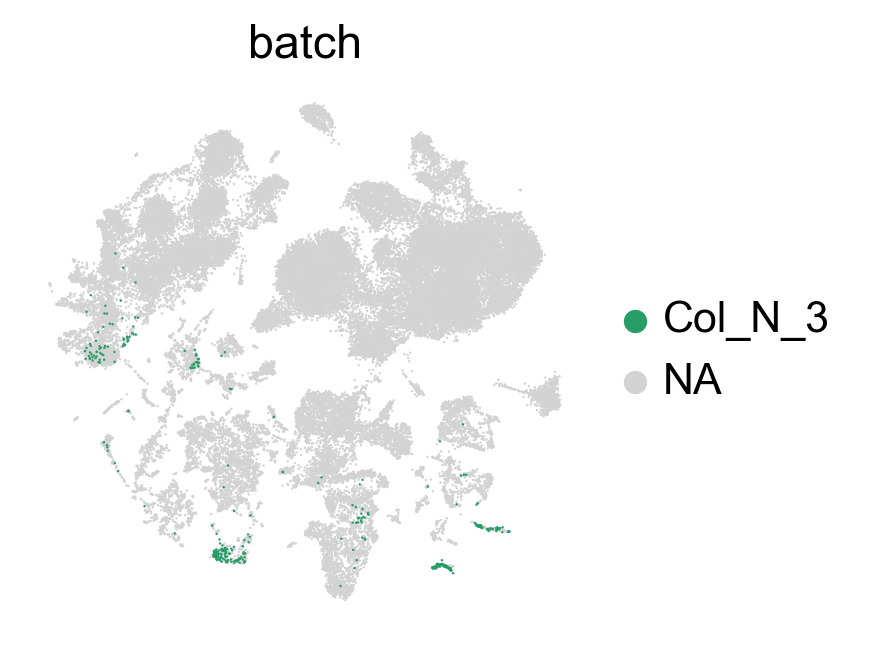

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


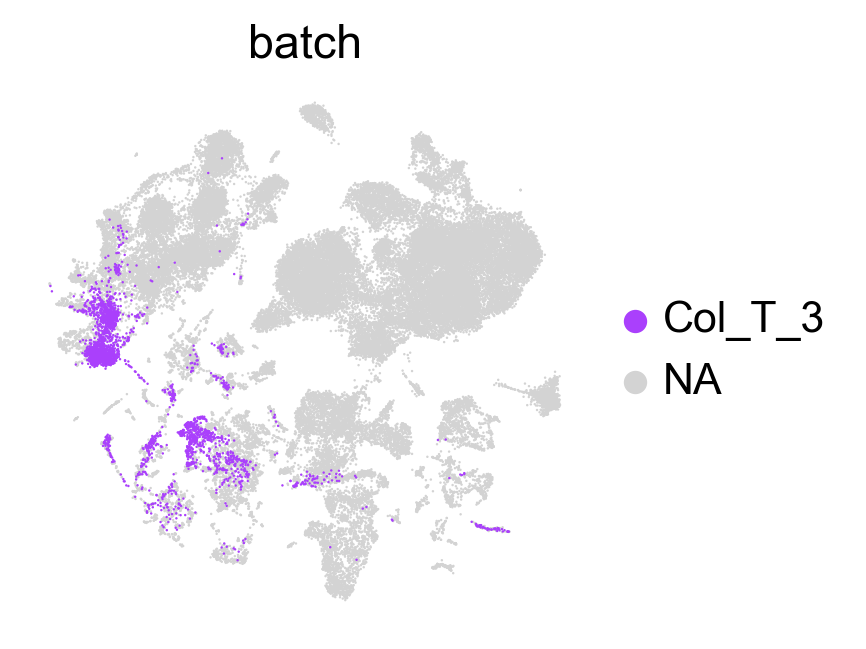

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


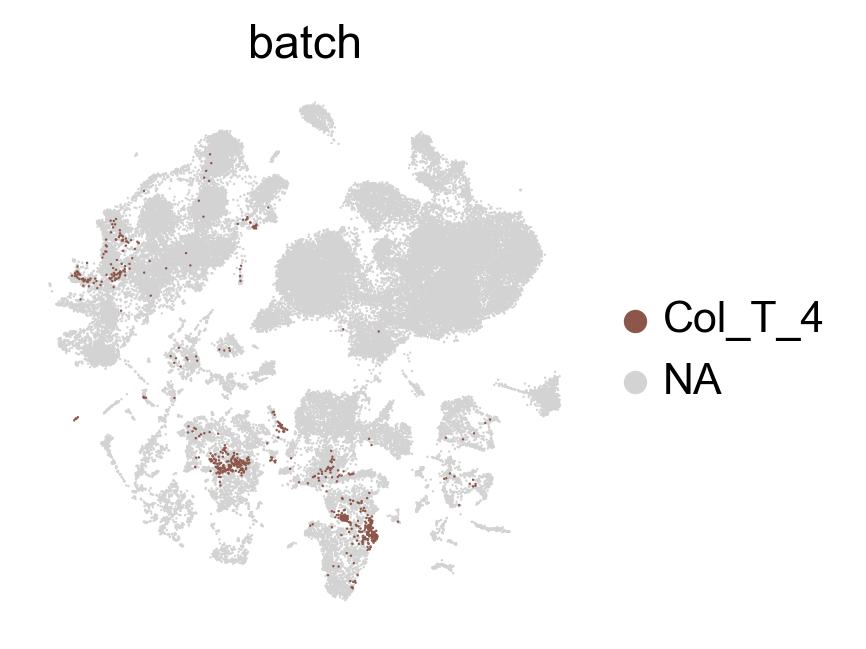

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


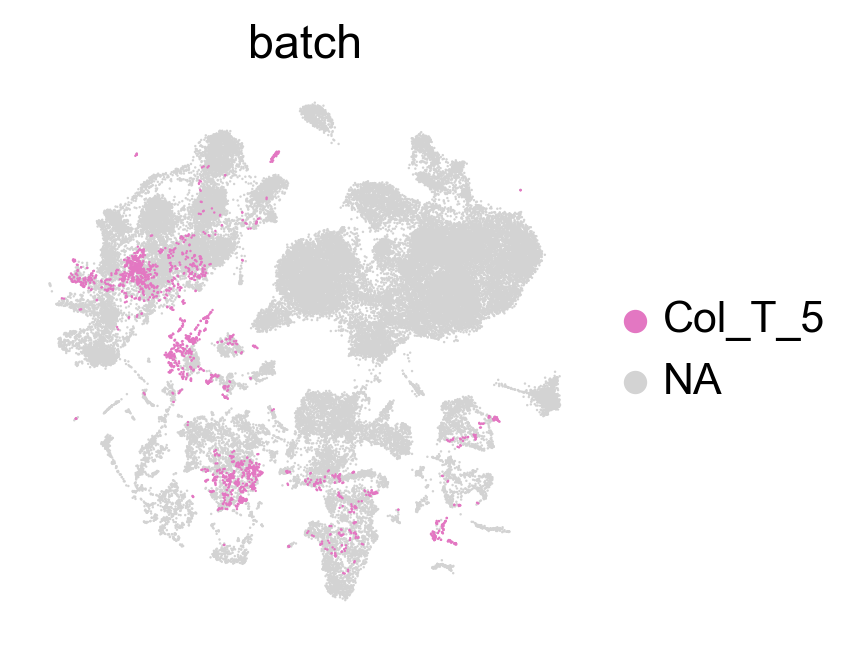

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


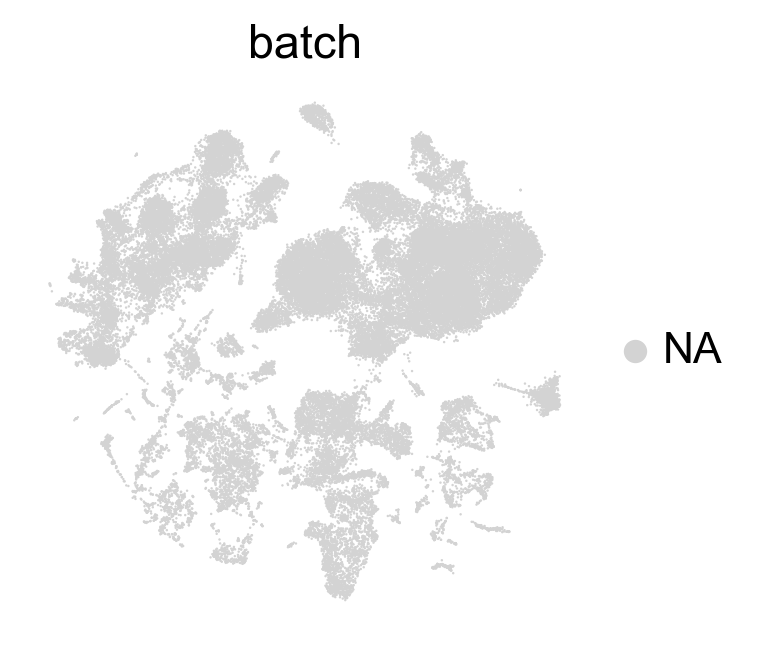

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


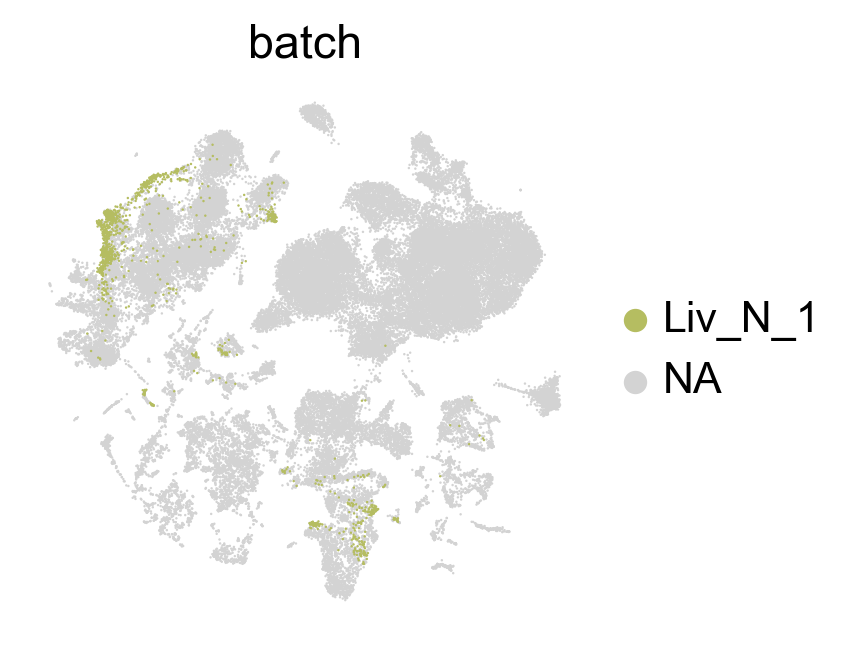

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


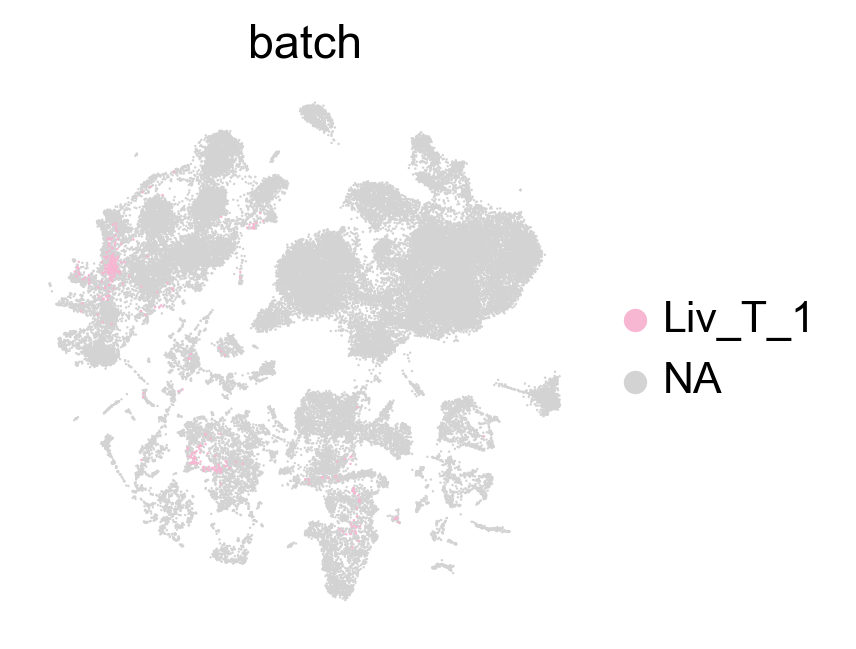

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


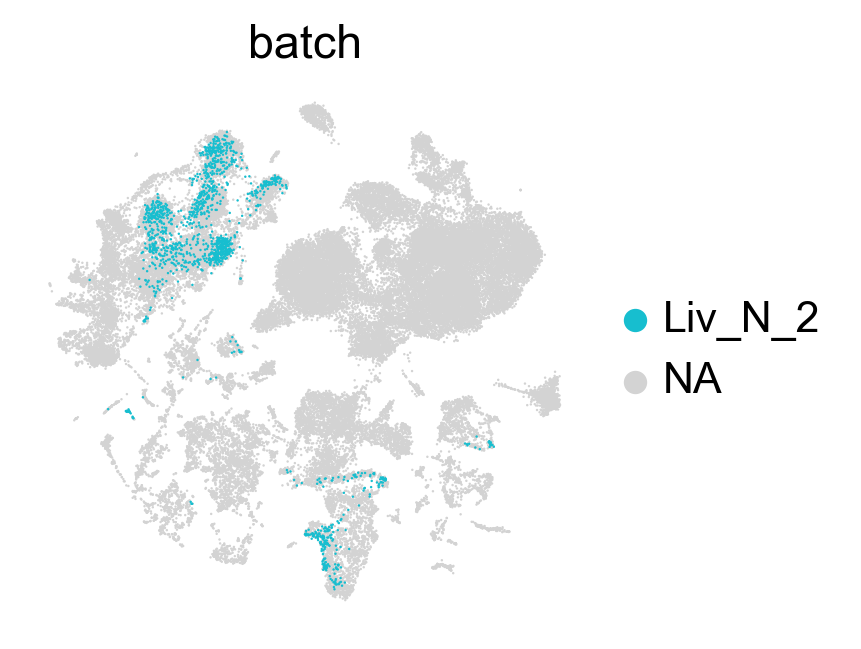

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


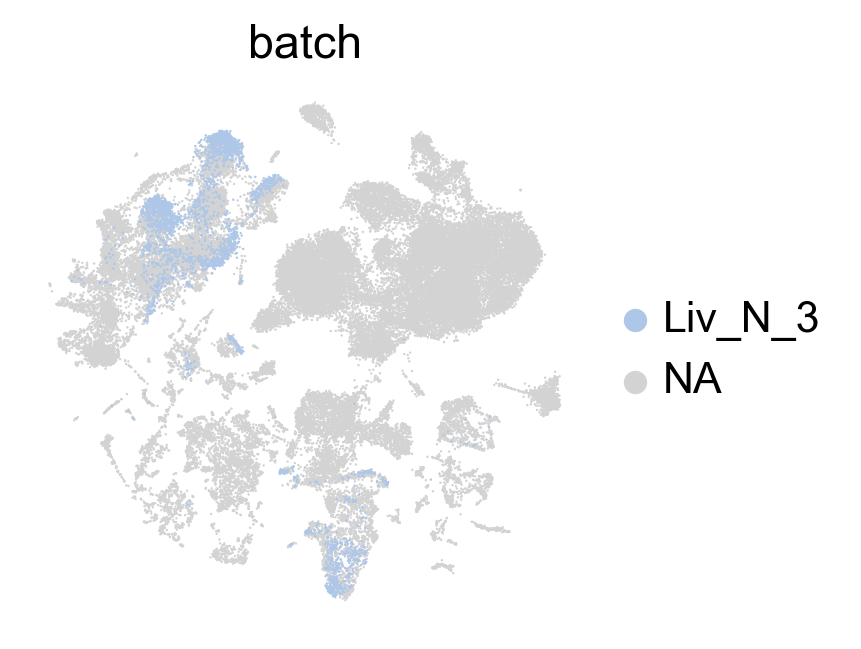

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


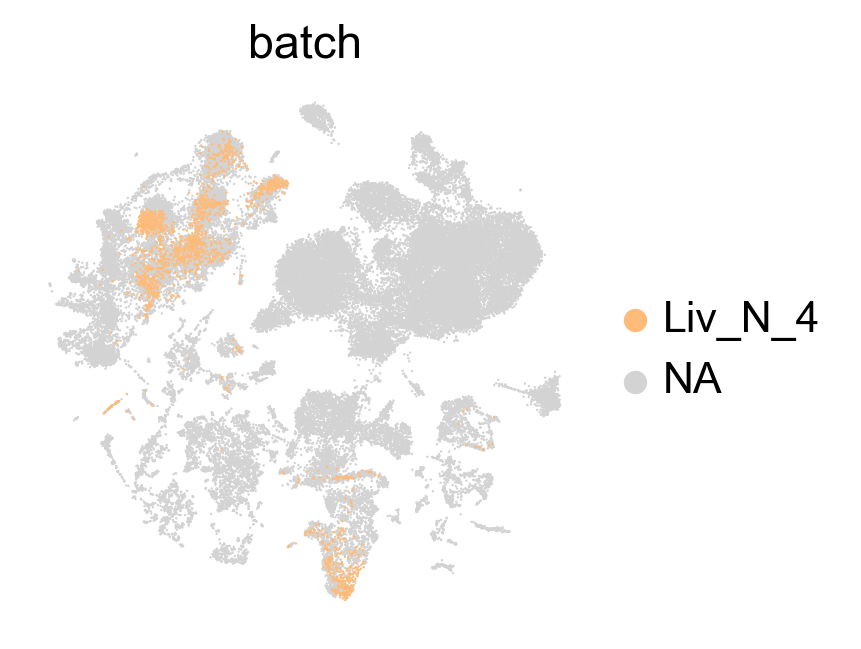

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


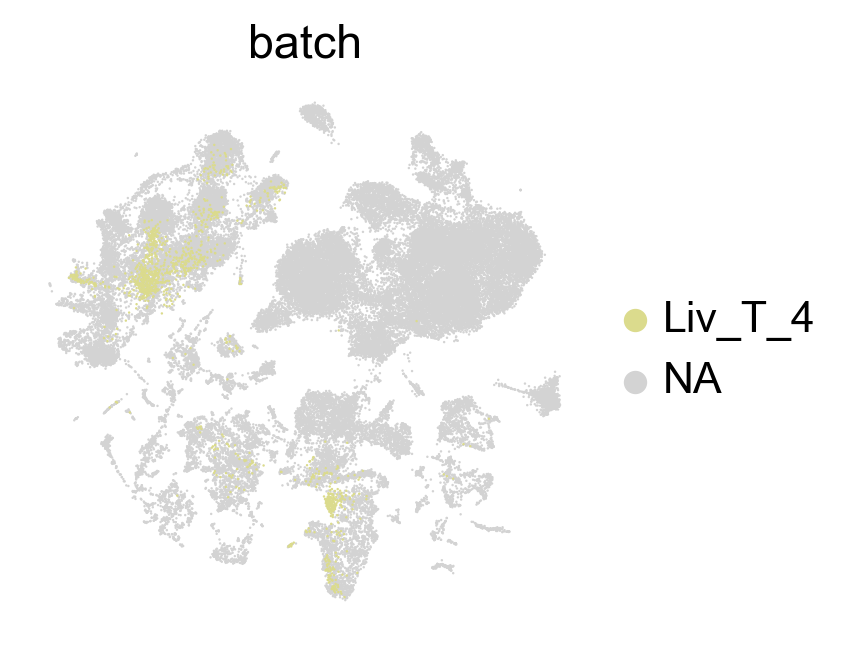

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


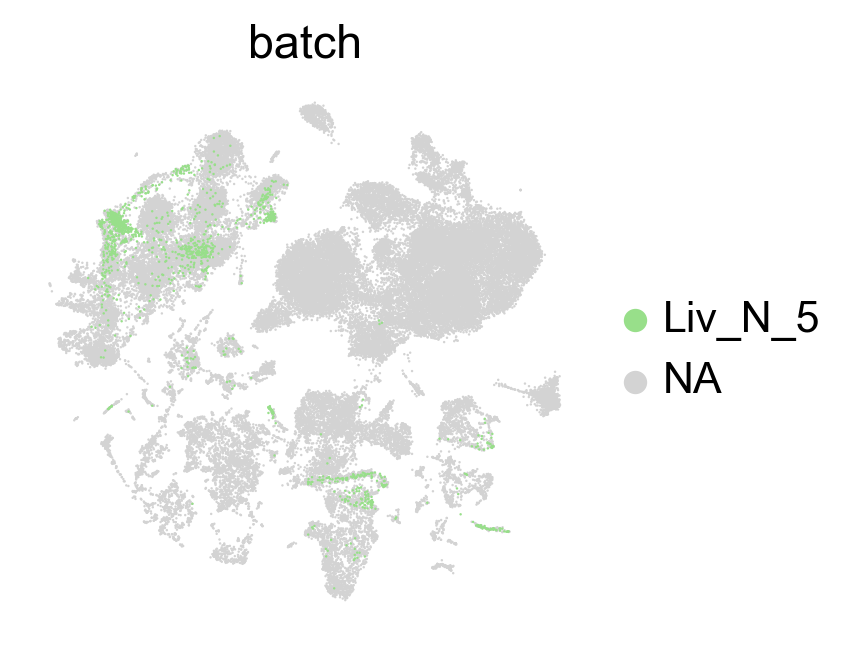

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


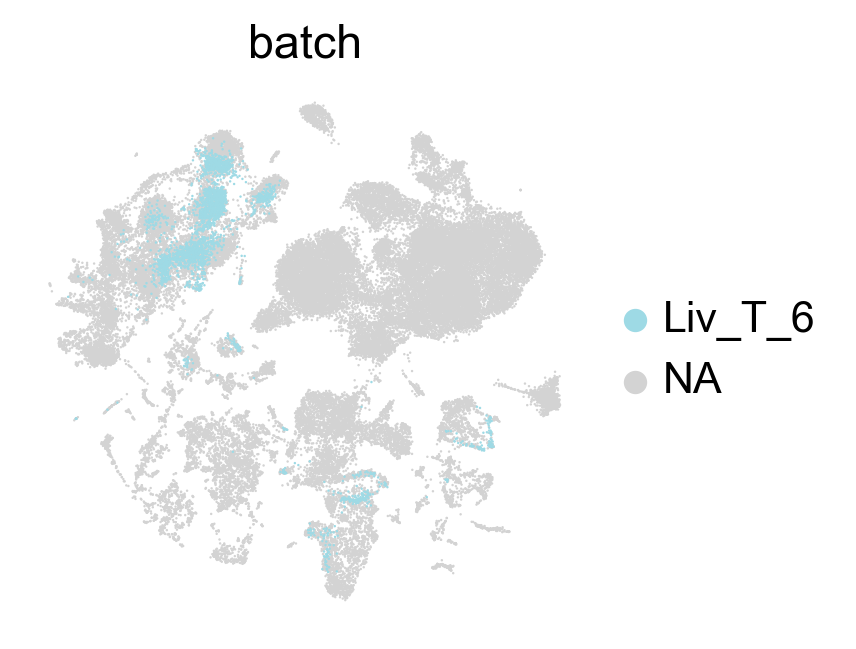

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


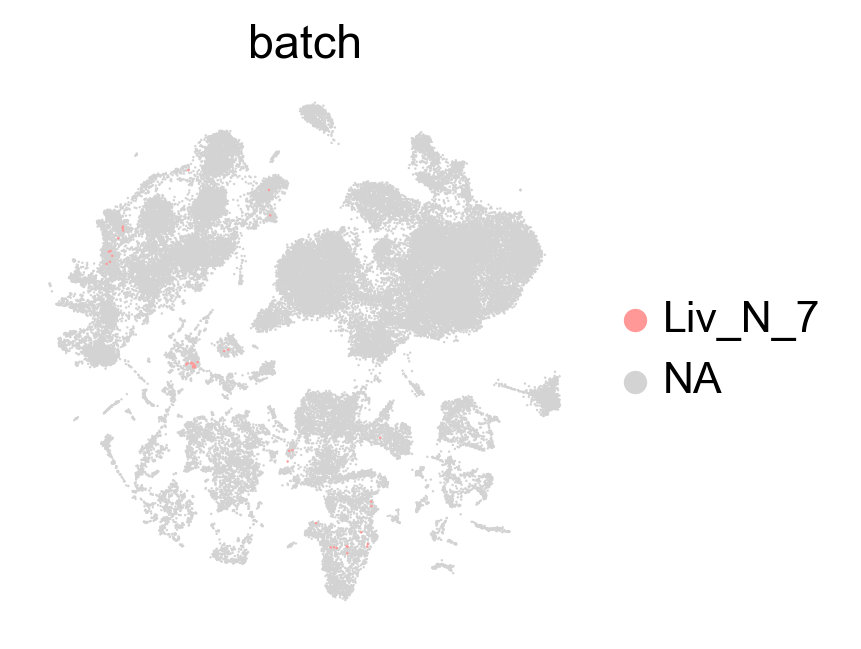

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


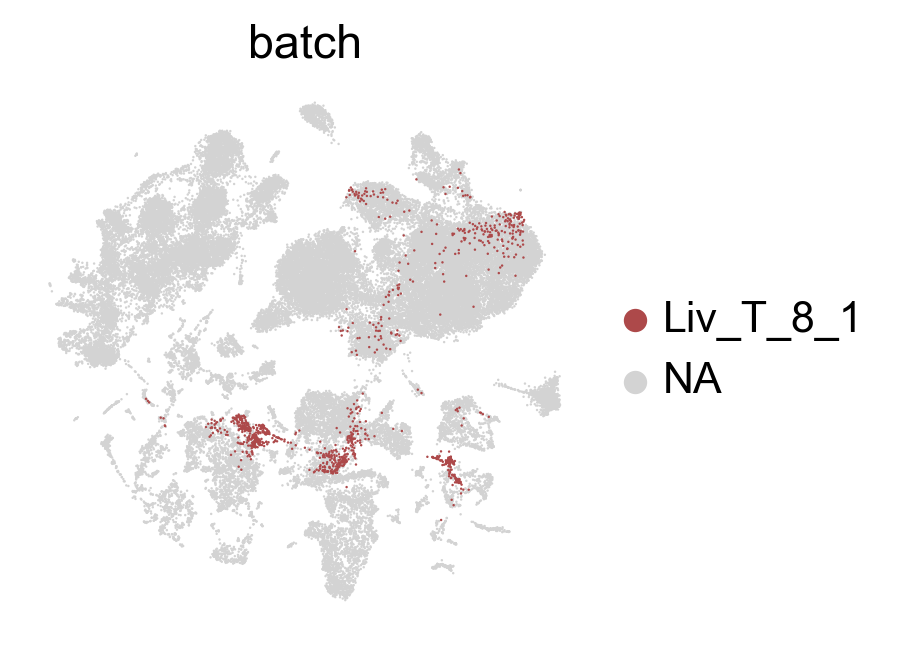

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


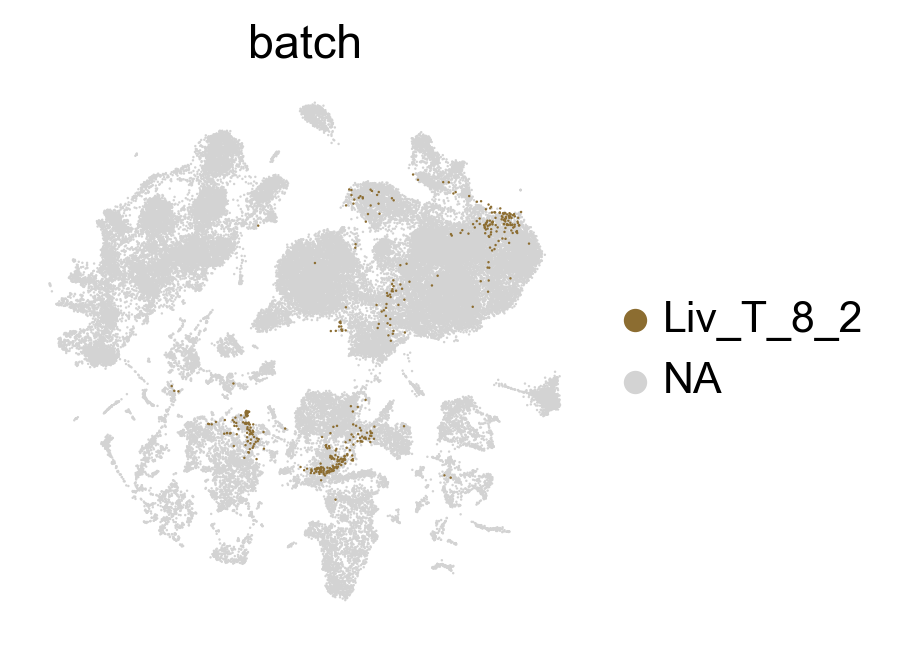

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


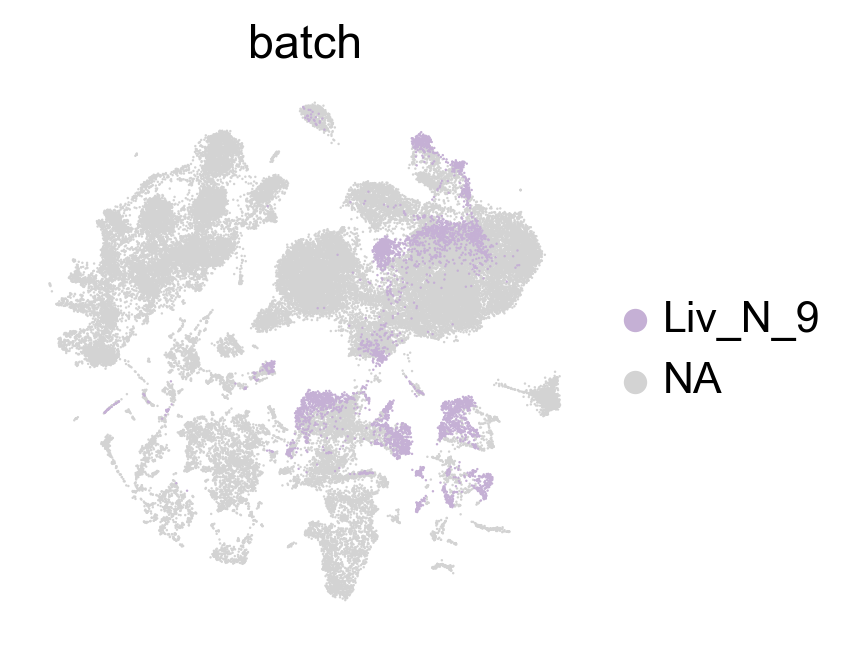

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


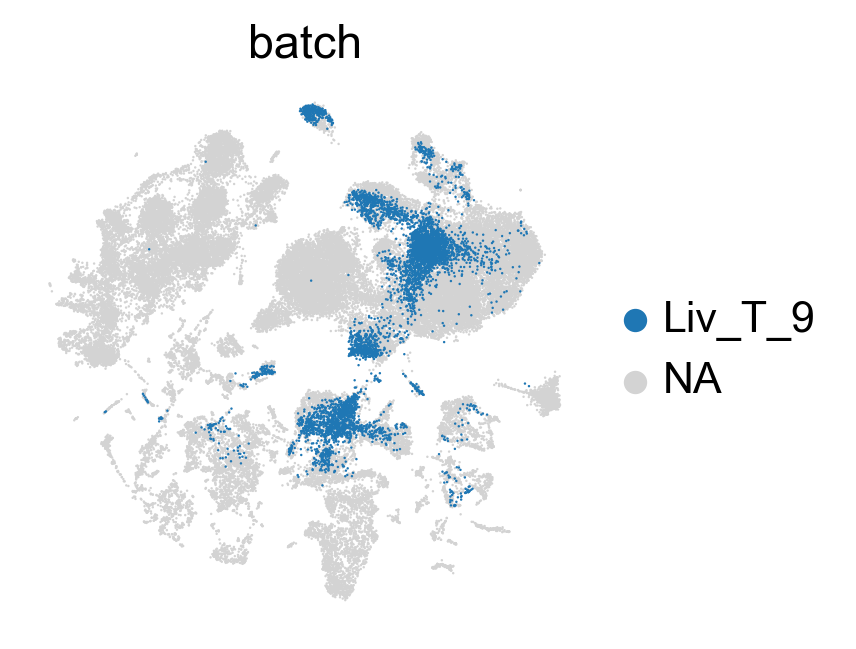

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


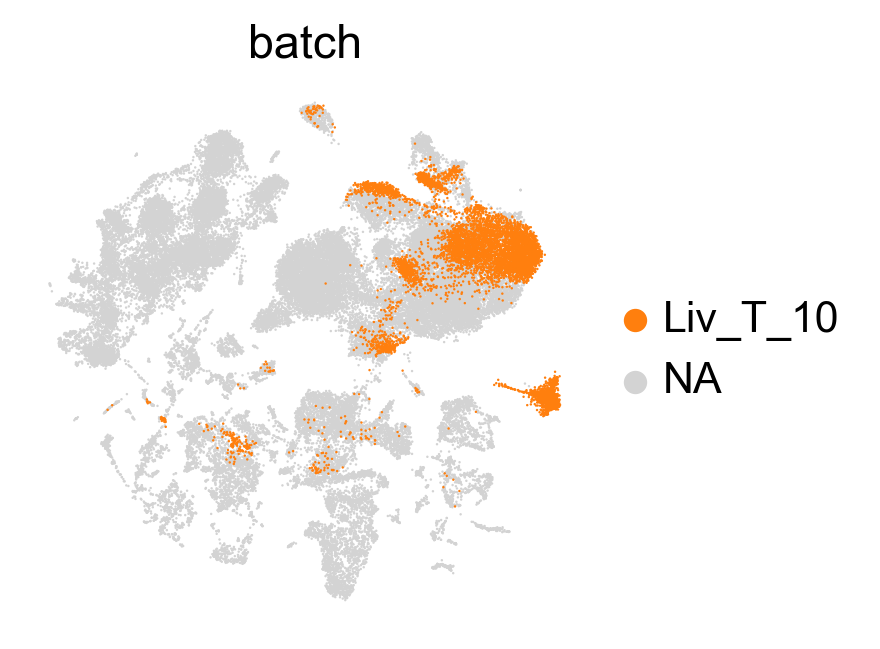

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


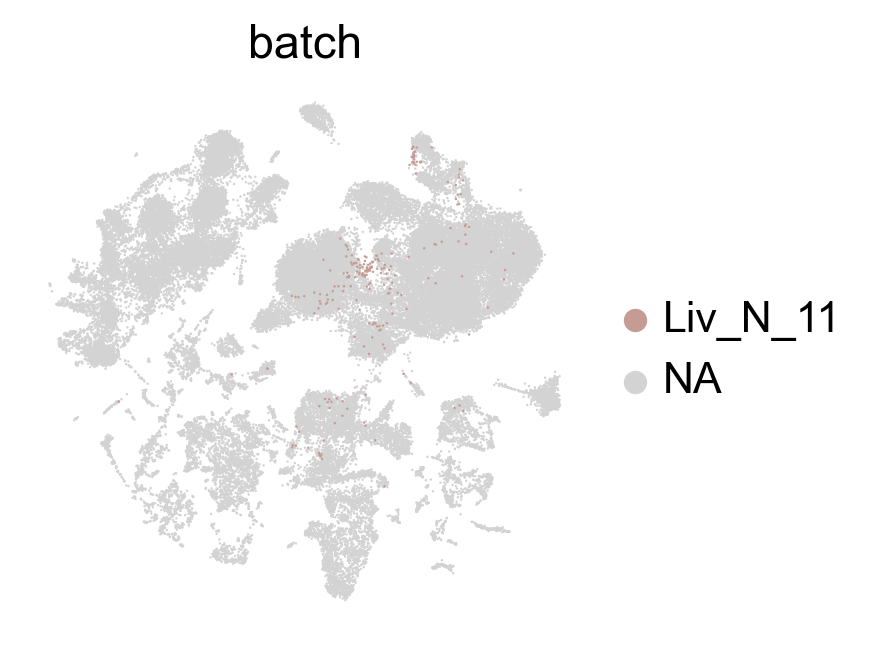

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


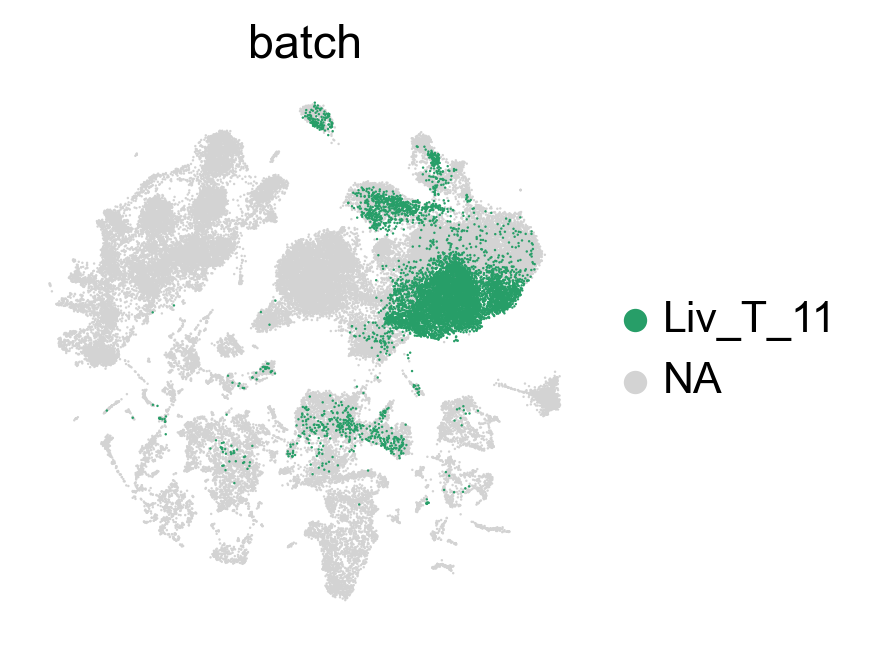

/Users/xuewei/ZeroData/softwares/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


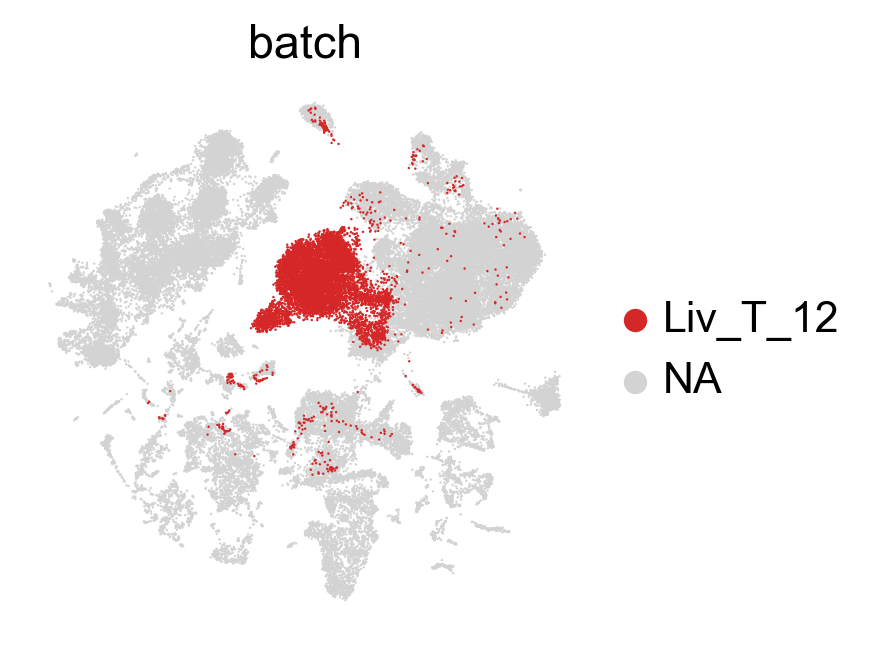

In [39]:
for batch in ['Col_N_1', 'Col_T_1', 'Col_N_2', 'Col_T_2', 'Col_N_3', 'Col_T_3', 'Col_T_4', 'Col_T_5', 'Col_T_6', 'Liv_N_1', 
              'Liv_T_1', 'Liv_N_2', 'Liv_N_3', 'Liv_N_4', 'Liv_T_4', 'Liv_N_5', 'Liv_T_6', 'Liv_N_7', 'Liv_T_8_1', 'Liv_T_8_2', 
              'Liv_N_9', 'Liv_T_9', 'Liv_T_10', 'Liv_N_11', 'Liv_T_11', 'Liv_T_12']:
    sc.pl.umap(adata, color='batch', groups=[batch])

In [40]:
adata.write_h5ad('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_03_harmony_integrate_20231028.h5ad')

## Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [41]:
adata = sc.read('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_03_harmony_integrate_20231028.h5ad')

In [42]:
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
# sc.pp.scale(adata, max_value=10)

In [43]:
adata

AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'batch_colors', 'draw_graph', 'hvg', 'log1p', 'neighbors', 'pca', 'umap', 'umap_density_batch_params'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Principal component analysis

## Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [44]:
# sc.tl.pca(adata, svd_solver='arpack', n_comps=50)

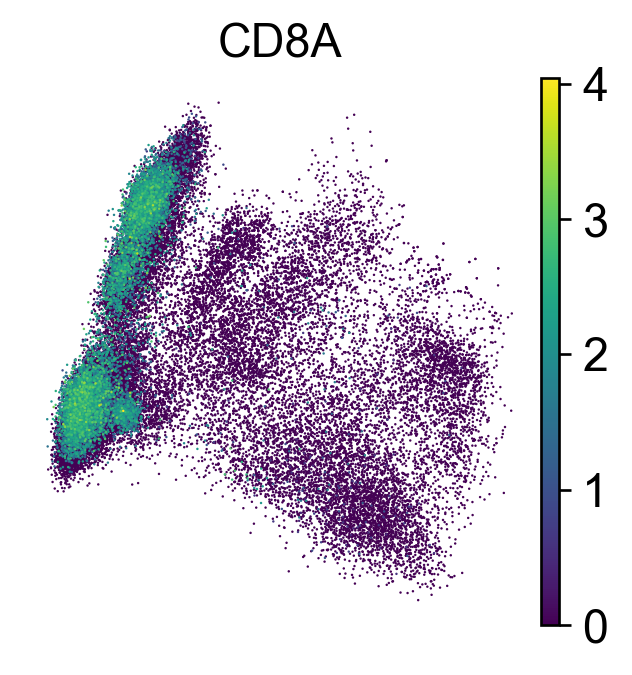

In [45]:
# pd.Series(adata.var['dispersions']).sort_values(ascending=False)
sc.pl.pca(adata, color='CD8A', show=True)

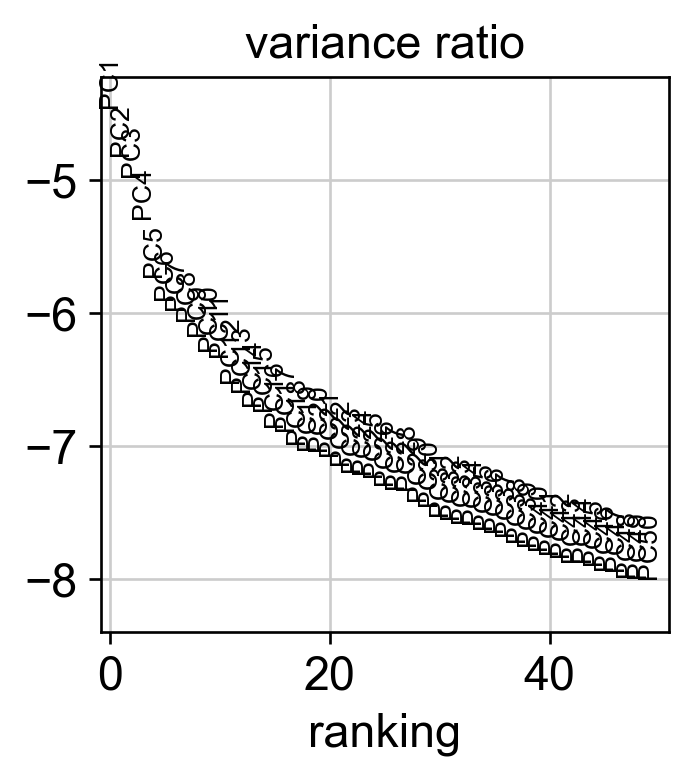

In [46]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True, show=True)

In [47]:
adata

AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'batch_colors', 'draw_graph', 'hvg', 'log1p', 'neighbors', 'pca', 'umap', 'umap_density_batch_params'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## Using BBKNN

In [48]:
# sc.external.pp.bbknn(adata, batch_key='batch')
# sc.tl.umap(adata)
# sc.pl.umap(adata, color=['batch'], show=True)

# Computing the neighborhood graph

## compute the neighborhood graph of cells using the PCA representation

In [49]:
# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

## Clustering the neighborhood graph

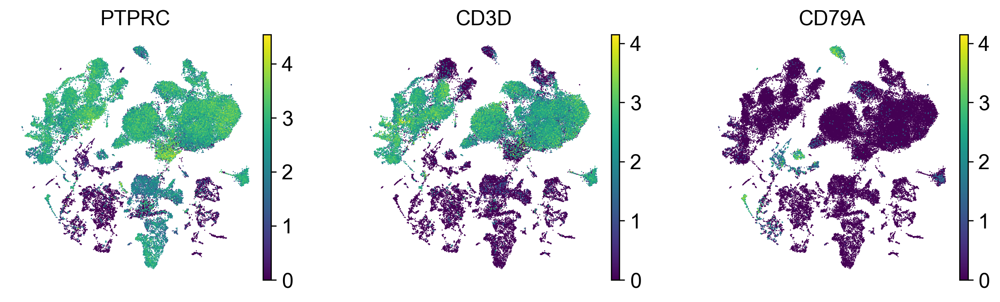

In [50]:
# sc.tl.umap(adata)
sc.pl.umap(adata, color=['PTPRC', 'CD3D', 'CD79A'], show=True, save="_02_neighbors.pdf")

## Embedding the neighborhood graph

In [51]:
# sc.tl.leiden(adata, resolution = 0.2, key_added = "leiden_0.2")
# sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
# sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
# sc.tl.leiden(adata, resolution = 0.8, key_added = "leiden_0.8")
# sc.tl.leiden(adata, resolution = 1.0, key_added = "leiden_1.0") # default resolution in 1.0
# sc.tl.leiden(adata, resolution = 1.2, key_added = "leiden_1.2")
# sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")
# sc.tl.leiden(adata, resolution = 1.6, key_added = "leiden_1.6")

# sc.pl.umap(adata, 
#     color=['leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_0.8', 'leiden_1.0', 'leiden_1.2', 'leiden_1.4', 'leiden_1.6'], legend_loc='on data', show=True)

In [52]:
# sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden")
# sc.pl.umap(adata, color=['leiden'], legend_loc='on data', show=True, save="_01_leiden_v1.pdf")

In [53]:
# sc.tl.tsne(adata)
# sc.pl.tsne(adata, color=['leiden', 'CD8A', 'CTLA4'], legend_loc='on data', use_raw=False, show=True, save="_01_leiden_v1.pdf")

In [54]:
# # embedding the graph in two dimensions using UMAP
# sc.tl.umap(adata)
# sc.pl.umap(adata, color=['leiden', 'CD8A', 'CTLA4'], legend_loc='on data', use_raw=False, show=True, save="_02_leiden_v1.pdf")

In [55]:
# sc.tl.louvain(adata, resolution = 0.2, key_added = "louvain_0.2")
# sc.tl.louvain(adata, resolution = 0.4, key_added = "louvain_0.4")
# sc.tl.louvain(adata, resolution = 0.6, key_added = "louvain_0.6")
# sc.tl.louvain(adata, resolution = 0.8, key_added = "louvain_0.8")
# sc.tl.louvain(adata, resolution = 1.0, key_added = "louvain_1.0") # default resolution in 1.0
# sc.tl.louvain(adata, resolution = 1.2, key_added = "louvain_1.2")
# sc.tl.louvain(adata, resolution = 1.4, key_added = "louvain_1.4")
# sc.tl.louvain(adata, resolution = 1.6, key_added = "louvain_1.6")

# sc.pl.umap(adata, 
#     color=['louvain_0.2', 'louvain_0.4', 'louvain_0.6', 'louvain_0.8', 'louvain_1.0', 'louvain_1.2', 'louvain_1.4', 'louvain_1.6'], legend_loc='on data', show=True)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:09)


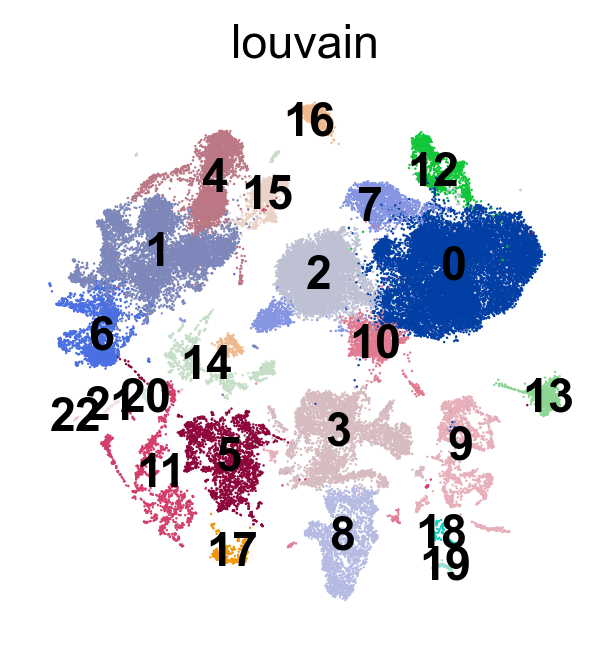

In [56]:
sc.tl.louvain(adata, resolution = 0.2, key_added = "louvain")
sc.pl.umap(adata, color=['louvain'], legend_loc='on data', show=True, save="_03_louvain.pdf")

In [57]:
adata.obs['louvain'].value_counts()

0     15673
1      7376
2      6260
3      4425
4      3123
      ...  
18      110
19      105
20       78
21       65
22       12
Name: louvain, Length: 23, dtype: int64

In [58]:
# sc.tl.tsne(adata)
# sc.pl.tsne(adata, color=['louvain'], legend_loc='on data', use_raw=False, show=True, save="_01_louvain.pdf")

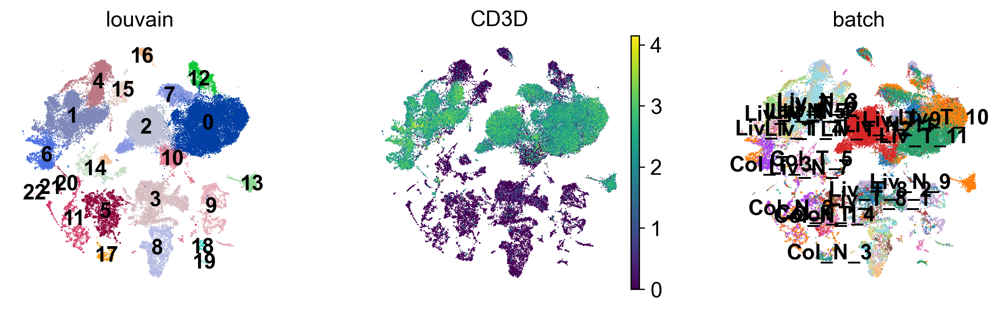

In [59]:
sc.pl.umap(adata, color=['louvain', 'CD3D', 'batch'], legend_loc='on data', show=True, save="_04_louvain_batch.pdf")

# sc.pl.umap(adata, color=['leiden', 'louvain', 'CD8A'], legend_loc='on data', show=True)
# sc.pl.umap(adata, color=['leiden', 'louvain', 'batch'], legend_loc='on data', show=True, save="_leiden_louvain_batch_v1.pdf")

In [60]:
adata.write_h5ad('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_01_louvain_umap_20231028.h5ad')

In [61]:
adata

AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch', 'louvain'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'batch_colors', 'draw_graph', 'hvg', 'log1p', 'neighbors', 'pca', 'umap', 'umap_density_batch_params', 'louvain', 'louvain_colors'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Finding marker genes

## Compute a ranking for the highly differential genes in each cluster.

In [62]:
# adata = sc.read_h5ad('/Users/xuewei/ZeroData/projects/STAD/GDPH_v3_20220919/local/write_v3/GC_01_louvain_umap_20220921.h5ad')

In [63]:
# sc.pp.log1p(adata)

In [64]:
# sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')
# sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, show=True, save="_01.pdf")
# # sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
# # sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [65]:
# adata

## Define a list of marker genes for later reference

Show the 5 top ranked genes per cluster 0, 1, …, 7 in a dataframe.

In [66]:
# res = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(500)
# res.to_csv("/Users/xuewei/ZeroData/projects/STAD/GDPH_v3_20220919/local/tables_v3/01_diff_top500.csv")

In [67]:
# adata.uns['rank_genes_groups'].keys()

In [68]:
# result = adata.uns['rank_genes_groups']
# groups = result['names'].dtype.names
# pd.DataFrame(
#     {group + '_' + key[:1]: result[key][group]
#     for group in groups for key in ['names', 'pvals']}).head(5)

# res = pd.DataFrame(    
#     {group + '_' + key: result[key][group]
#      for group in groups for key in ['names', 'pvals','logfoldchanges','pvals_adj','scores']})
# res.to_csv("/Users/xuewei/ZeroData/projects/STAD/GDPH_v3_20220919/local/tables_v3/01_dif_all.csv")

In [69]:
# with rc_context({'figure.figsize': (9, 3)}):
#     sc.pl.violin(adata, ['CD8A'], ncols=1, groupby='louvain', show=True)
#     sc.pl.violin(adata, ['CD4'], ncols=1, groupby='louvain', show=True)
#     sc.pl.violin(adata, ['CD79A'], ncols=1, groupby='louvain', show=True)

In [70]:
# sc.pl.rank_genes_groups_violin(adata, groups='0', strip=False, jitter=0, n_genes=8, show=True)
# sc.pl.rank_genes_groups_violin(adata, groups='1', strip=False, jitter=0, n_genes=8, show=True)

In [71]:
# adata

In [72]:
# adata.uns['louvain_colors']

In [73]:
# adata.to_df()

In [74]:
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)
# adata.obs['louvain'].value_counts()

In [75]:
# with rc_context({'figure.figsize': (9, 3)}):
#     sc.pl.violin(adata, ['CREM'], ncols=1, groupby='louvain', show=True)
#     sc.pl.violin(adata, ['CREM'], ncols=1, groupby='batch', show=True)

In [76]:
# with rc_context({'figure.figsize': (4, 4)}):
#     sc.pl.umap(adata, color=['louvain', 'batch', 'CREM'], legend_loc='on data', show=True)

In [77]:
# res=sc.get.obs_df(adata, keys=['louvain', 'CREM'], use_raw=True)
# res=pd.DataFrame(res)
# res.to_csv("01_CREM_louvain_v1.csv", sep="\t")

# res=sc.get.obs_df(adata, keys=['batch', 'CREM'], use_raw=True)
# res=pd.DataFrame(res)
# res.to_csv("01_CREM_batch_v1.csv", sep="\t")

In [78]:
# row_attrs = { 
#     "Gene": np.array(adata.var.index) ,
# }

# row_attrs
# row_attrs = pd.DataFrame(row_attrs)
# row_attrs.to_csv("01_row_attrs_v1.csv")

In [79]:
# col_attrs = { 
#     "CellID": np.array(adata.obs.index) ,
#     "nGene": np.array( np.sum(adata.X.transpose()>0 , axis=0)).flatten() ,
#     "nUMI": np.array( np.sum(adata.X.transpose() , axis=0)).flatten() ,
# }

# col_attrs
# col_attrs = pd.DataFrame(col_attrs)
# col_attrs.to_csv("01_col_attrs_v1.csv")